# GraphCast

This colab lets you run several versions of GraphCast.

The model weights, normalization statistics, and example inputs are available on [Google Cloud Bucket](https://console.cloud.google.com/storage/browser/dm_graphcast).

A Colab runtime with TPU/GPU acceleration will substantially speed up generating predictions and computing the loss/gradients. If you're using a CPU-only runtime, you can switch using the menu "Runtime > Change runtime type".

> <p><small><small>Copyright 2023 DeepMind Technologies Limited.</small></p>
> <p><small><small>Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License. You may obtain a copy of the License at <a href="http://www.apache.org/licenses/LICENSE-2.0">http://www.apache.org/licenses/LICENSE-2.0</a>.</small></small></p>
> <p><small><small>Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.</small></small></p>

# Installation and Initialization


In [ ]:
# @title Pip install graphcast and dependencies

%pip install --upgrade https://github.com/SaptarishiD/graphcast/archive/new_sys.zip

     | 597.1 kB 1.6 MB/s 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 373.9/373.9 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 19.6 MB/s eta 0:00:00
  Created wheel for graphcast: filename=graphcast-0.1.1-py3-none-any.whl size=132262 sha256=3c6200387bf83b077fb12fcc5be16d7543c69e498e1fe1a33327fcedefd65fbb
  Stored in directory: /tmp/pip-ephem-wheel-cache-rpe9zcb5/wheels/a3/00/98/39de452e6f279f2bd5a7470eda346e1c3119f18b0900374a97
Successfully built graphcast


In [2]:
# @title Workaround for cartopy crashes

# Workaround for cartopy crashes due to the shapely installed by default in
# google colab kernel (https://github.com/anitagraser/movingpandas/issues/81):
!pip uninstall -y shapely
!pip install shapely --no-binary shapely

Found existing installation: shapely 2.1.0
Uninstalling shapely-2.1.0:
  Successfully uninstalled shapely-2.1.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 8.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for shapely: filename=shapely-2.1.0-cp311-cp311-linux_x86_64.whl size=1187350 sha256=bf3f1839902183c0076c18119546f7820d1e818110c67a72ef22a0bd21ab65f3
  Stored in directory: /root/.cache/pip/wheels/1c/af/c6/303cf0027549d1cd9c1fb6991d3bf37dd1c18c317cf1cef5b5
Successfully built shapely


In [3]:
# @title Imports

import dataclasses
import datetime
import functools
import math
import re
from typing import Optional

import cartopy.crs as ccrs
from google.cloud import storage
from graphcast import autoregressive
from graphcast import casting
from graphcast import checkpoint
from graphcast import data_utils
from graphcast import graphcast
from graphcast import normalization
from graphcast import rollout
from graphcast import xarray_jax
from graphcast import xarray_tree
from IPython.display import HTML
import ipywidgets as widgets
import haiku as hk
import jax
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
import xarray


def parse_file_parts(file_name):
  return dict(part.split("-", 1) for part in file_name.split("_"))


In [4]:
# @title Authenticate with Google Cloud Storage

gcs_client = storage.Client.create_anonymous_client()
gcs_bucket = gcs_client.get_bucket("dm_graphcast")
dir_prefix = "graphcast/"

In [5]:
# @title Plotting functions

def select(
    data: xarray.Dataset,
    variable: str,
    level: Optional[int] = None,
    max_steps: Optional[int] = None
    ) -> xarray.Dataset:
  data = data[variable]
  if "batch" in data.dims:
    data = data.isel(batch=0)
  if max_steps is not None and "time" in data.sizes and max_steps < data.sizes["time"]:
    data = data.isel(time=range(0, max_steps))
  if level is not None and "level" in data.coords:
    data = data.sel(level=level)
  return data

def scale(
    data: xarray.Dataset,
    center: Optional[float] = None,
    robust: bool = False,
    ) -> tuple[xarray.Dataset, matplotlib.colors.Normalize, str]:
  vmin = np.nanpercentile(data, (2 if robust else 0))
  vmax = np.nanpercentile(data, (98 if robust else 100))
  if center is not None:
    diff = max(vmax - center, center - vmin)
    vmin = center - diff
    vmax = center + diff
  return (data, matplotlib.colors.Normalize(vmin, vmax),
          ("RdBu_r" if center is not None else "viridis"))

def plot_data(
    data: dict[str, xarray.Dataset],
    fig_title: str,
    plot_size: float = 5,
    robust: bool = False,
    cols: int = 4
    ) -> tuple[xarray.Dataset, matplotlib.colors.Normalize, str]:

  first_data = next(iter(data.values()))[0]
  max_steps = first_data.sizes.get("time", 1)
  assert all(max_steps == d.sizes.get("time", 1) for d, _, _ in data.values())

  cols = min(cols, len(data))
  rows = math.ceil(len(data) / cols)
  figure = plt.figure(figsize=(plot_size * 2 * cols,
                               plot_size * rows))
  figure.suptitle(fig_title, fontsize=16)
  figure.subplots_adjust(wspace=0, hspace=0)
  figure.tight_layout()

  images = []
  for i, (title, (plot_data, norm, cmap)) in enumerate(data.items()):
    ax = figure.add_subplot(rows, cols, i+1)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title)
    im = ax.imshow(
        plot_data.isel(time=0, missing_dims="ignore"), norm=norm,
        origin="lower", cmap=cmap)
    plt.colorbar(
        mappable=im,
        ax=ax,
        orientation="vertical",
        pad=0.02,
        aspect=16,
        shrink=0.75,
        cmap=cmap,
        extend=("both" if robust else "neither"))
    images.append(im)

  def update(frame):
    if "time" in first_data.dims:
      td = datetime.timedelta(microseconds=first_data["time"][frame].item() / 1000)
      figure.suptitle(f"{fig_title}, {td}", fontsize=16)
    else:
      figure.suptitle(fig_title, fontsize=16)
    for im, (plot_data, norm, cmap) in zip(images, data.values()):
      im.set_data(plot_data.isel(time=frame, missing_dims="ignore"))

  ani = animation.FuncAnimation(
      fig=figure, func=update, frames=max_steps, interval=250)
  plt.close(figure.number)
  return HTML(ani.to_jshtml())

# Load the Data and initialize the model

## Load the model params

Choose one of the two ways of getting model params:
- **random**: You'll get random predictions, but you can change the model architecture, which may run faster or fit on your device.
- **checkpoint**: You'll get sensible predictions, but are limited to the model architecture that it was trained with, which may not fit on your device. In particular generating gradients uses a lot of memory, so you'll need at least 25GB of ram (TPUv4 or A100).

Checkpoints vary across a few axes:
- The mesh size specifies the internal graph representation of the earth. Smaller meshes will run faster but will have worse outputs. The mesh size does not affect the number of parameters of the model.
- The resolution and number of pressure levels must match the data. Lower resolution and fewer levels will run a bit faster. Data resolution only affects the encoder/decoder.
- All our models predict precipitation. However, ERA5 includes precipitation, while HRES does not. Our models marked as "ERA5" take precipitation as input and expect ERA5 data as input, while model marked "ERA5-HRES" do not take precipitation as input and are specifically trained to take HRES-fc0 as input (see the data section below).

We provide three pre-trained models.
1. `GraphCast`, the high-resolution model used in the GraphCast paper (0.25 degree resolution, 37 pressure levels), trained on ERA5 data from 1979 to 2017,

2. `GraphCast_small`, a smaller, low-resolution version of GraphCast (1 degree resolution, 13 pressure levels, and a smaller mesh), trained on ERA5 data from 1979 to 2015, useful to run a model with lower memory and compute constraints,

3. `GraphCast_operational`, a high-resolution model (0.25 degree resolution, 13 pressure levels) pre-trained on ERA5 data from 1979 to 2017 and fine-tuned on HRES data from 2016 to 2021. This model can be initialized from HRES data (does not require precipitation inputs).


In [6]:
# @title Choose the model

params_file_options = [
    name for blob in gcs_bucket.list_blobs(prefix=dir_prefix+"params/")
    if (name := blob.name.removeprefix(dir_prefix+"params/"))]  # Drop empty string.

random_mesh_size = widgets.IntSlider(
    value=4, min=4, max=6, description="Mesh size:")
random_gnn_msg_steps = widgets.IntSlider(
    value=4, min=1, max=32, description="GNN message steps:")
random_latent_size = widgets.Dropdown(
    options=[int(2**i) for i in range(4, 10)], value=32,description="Latent size:")
random_levels = widgets.Dropdown(
    options=[13, 37], value=13, description="Pressure levels:")


params_file = widgets.Dropdown(
    options=params_file_options,
    description="Params file:",
    layout={"width": "max-content"})

source_tab = widgets.Tab([
    widgets.VBox([
        random_mesh_size,
        random_gnn_msg_steps,
        random_latent_size,
        random_levels,
    ]),
    params_file,
])
source_tab.set_title(0, "Random")
source_tab.set_title(1, "Checkpoint")
widgets.VBox([
    source_tab,
    widgets.Label(value="Run the next cell to load the model. Rerunning this cell clears your selection.")
])


In [7]:
# @title Load the model
graphcast_small = "GraphCast_small - ERA5 1979-2015 - resolution 1.0 - pressure levels 13 - mesh 2to5 - precipitation input and output.npz"
graphcast_large = "GraphCast - ERA5 1979-2017 - resolution 0.25 - pressure levels 37 - mesh 2to6 - precipitation input and output.npz"
source = source_tab.get_title(source_tab.selected_index)

if source == "Random":
  params = None  # Filled in below
  state = {}
  model_config = graphcast.ModelConfig(
      resolution=0,
      mesh_size=random_mesh_size.value,
      latent_size=random_latent_size.value,
      gnn_msg_steps=random_gnn_msg_steps.value,
      hidden_layers=1,
      radius_query_fraction_edge_length=0.6)
  task_config = graphcast.TaskConfig(
      input_variables=graphcast.TASK.input_variables,
      target_variables=graphcast.TASK.target_variables,
      forcing_variables=graphcast.TASK.forcing_variables,
      pressure_levels=graphcast.PRESSURE_LEVELS[random_levels.value],
      input_duration=graphcast.TASK.input_duration,
  )
else:
  assert source == "Checkpoint"
  print(params_file.value)
  with gcs_bucket.blob(f"params/{graphcast_small}").open("rb") as f:
    ckpt = checkpoint.load(f, graphcast.CheckPoint)
  params = ckpt.params
  state = {}

  model_config = ckpt.model_config
  task_config = ckpt.task_config
  print("Model description:\n", ckpt.description, "\n")
  print("Model license:\n", ckpt.license, "\n")

model_config

ModelConfig(resolution=0, mesh_size=4, latent_size=32, gnn_msg_steps=4, hidden_layers=1, radius_query_fraction_edge_length=0.6, mesh2grid_edge_normalization_factor=None)

## Load the example data

Several example datasets are available, varying across a few axes:
- **Source**: fake, era5, hres
- **Resolution**: 0.25deg, 1deg, 6deg
- **Levels**: 13, 37
- **Steps**: How many timesteps are included

Not all combinations are available.
- Higher resolution is only available for fewer steps due to the memory requirements of loading them.
- HRES is only available in 0.25 deg, with 13 pressure levels.

The data resolution must match the model that is loaded.

Some transformations were done from the base datasets:
- We accumulated precipitation over 6 hours instead of the default 1 hour.
- For HRES data, each time step corresponds to the HRES forecast at leadtime 0, essentially providing an "initialisation" from HRES. See HRES-fc0 in the GraphCast paper for further description. Note that a 6h accumulation of precipitation is not available from HRES, so our model taking HRES inputs does not depend on precipitation. However, because our models predict precipitation, we include the ERA5 precipitation in the example data so it can serve as an illustrative example of ground truth.
- We include ERA5 `toa_incident_solar_radiation` in the data. Our model uses the radiation at -6h, 0h and +6h as a forcing term for each 1-step prediction. If the radiation is missing from the data (e.g. in an operational setting), it will be computed using a custom implementation that produces values similar to those in ERA5.

In [ ]:
# @title Get and filter the list of available example datasets

dataset_file_options = [
    name for blob in gcs_bucket.list_blobs(prefix=dir_prefix+"dataset/")
    if (name := blob.name.removeprefix(dir_prefix+"dataset/"))]  # Drop empty string.

def data_valid_for_model(
    file_name: str, model_config: graphcast.ModelConfig, task_config: graphcast.TaskConfig):
  file_parts = parse_file_parts(file_name.removesuffix(".nc"))
  return (
      model_config.resolution in (0, float(file_parts["res"])) and
      len(task_config.pressure_levels) == int(file_parts["levels"]) and
      (
          ("total_precipitation_6hr" in task_config.input_variables and
           file_parts["source"] in ("era5", "fake")) or
          ("total_precipitation_6hr" not in task_config.input_variables and
           file_parts["source"] in ("hres", "fake"))
      )
  )


dataset_file = widgets.Dropdown(
    options=[
        (", ".join([f"{k}: {v}" for k, v in parse_file_parts(option.removesuffix(".nc")).items()]), option)
        for option in dataset_file_options
        if data_valid_for_model(option, model_config, task_config)
    ],
    description="Dataset file:",
    layout={"width": "max-content"})
widgets.VBox([
    dataset_file,
    widgets.Label(value="Run the next cell to load the dataset. Rerunning this cell clears your selection and refilters the datasets that match your model.")
])

In [9]:

res1levels13steps12 = "source-era5_date-2022-01-01_res-1.0_levels-13_steps-12.nc"
res025levels37steps04 = "source-era5_date-2022-01-01_res-0.25_levels-37_steps-04.nc"

which_data = res1levels13steps12

if not data_valid_for_model(dataset_file.value, model_config, task_config):
  raise ValueError(
      "Invalid dataset file, rerun the cell above and choose a valid dataset file.")

print(dataset_file.value)
with gcs_bucket.blob(f"dataset/{res1levels13steps12}").open("rb") as f:
  example_batch = xarray.load_dataset(f).compute()

assert example_batch.dims["time"] >= 3  # 2 for input, >=1 for targets

print(", ".join([f"{k}: {v}" for k, v in parse_file_parts(res1levels13steps12.removesuffix(".nc")).items()]))

example_batch

source-era5_date-2022-01-01_res-0.25_levels-13_steps-01.nc


<ipython-input-9-761aef4c5013>:12: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  example_batch = xarray.load_dataset(f).compute()
<ipython-input-9-761aef4c5013>:14: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  assert example_batch.dims["time"] >= 3  # 2 for input, >=1 for targets


source: era5, date: 2022-01-01, res: 1.0, levels: 13, steps: 12


<xarray.Dataset> Size: 307MB
Dimensions:                       (lon: 360, lat: 181, time: 14, level: 13,
                                   batch: 1)
Coordinates:
  * lon                           (lon) float32 1kB 0.0 1.0 2.0 ... 358.0 359.0
  * lat                           (lat) float32 724B -90.0 -89.0 ... 89.0 90.0
  * time                          (time) timedelta64[ns] 112B 0 days 00:00:00...
  * level                         (level) int32 52B 50 100 150 ... 850 925 1000
    datetime                      (batch, time) datetime64[ns] 112B 2022-01-0...
Dimensions without coordinates: batch
Data variables: (12/14)
    geopotential_at_surface       (lat, lon) float32 261kB 2.735e+04 ... -0.0...
    land_sea_mask                 (lat, lon) float32 261kB 1.0 1.0 ... 0.0 0.0
    2m_temperature                (batch, time, lat, lon) float32 4MB 250.7 ....
    mean_sea_level_pressure       (batch, time, lat, lon) float32 4MB 9.931e+...
    10m_v_component_of_wind       (batch, time, lat, lon) float32 4MB -0.4393...
    10m_u_component_of_wind       (batch, time, lat, lon) float32 4MB 1.309 ....
    ...                            ...
    temperature                   (batch, time, level, lat, lon) float32 47MB ...
    geopotential                  (batch, time, level, lat, lon) float32 47MB ...
    u_component_of_wind           (batch, time, level, lat, lon) float32 47MB ...
    v_component_of_wind           (batch, time, level, lat, lon) float32 47MB ...
    vertical_velocity             (batch, time, level, lat, lon) float32 47MB ...
    specific_humidity             (batch, time, level, lat, lon) float32 47MB ...

In [10]:
# @title Choose data to plot

plot_example_variable = widgets.Dropdown(
    options=example_batch.data_vars.keys(),
    value="2m_temperature",
    description="Variable")
plot_example_level = widgets.Dropdown(
    options=example_batch.coords["level"].values,
    value=500,
    description="Level")
plot_example_robust = widgets.Checkbox(value=True, description="Robust")
plot_example_max_steps = widgets.IntSlider(
    min=1, max=example_batch.dims["time"], value=example_batch.dims["time"],
    description="Max steps")

widgets.VBox([
    plot_example_variable,
    plot_example_level,
    plot_example_robust,
    plot_example_max_steps,
    widgets.Label(value="Run the next cell to plot the data. Rerunning this cell clears your selection.")
])

<ipython-input-10-623f62deb5d2>:13: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  min=1, max=example_batch.dims["time"], value=example_batch.dims["time"],


In [11]:
# @title Plot example data

plot_size = 7

data = {
    " ": scale(select(example_batch, plot_example_variable.value, plot_example_level.value, plot_example_max_steps.value),
              robust=plot_example_robust.value),
}
fig_title = plot_example_variable.value
if "level" in example_batch[plot_example_variable.value].coords:
  fig_title += f" at {plot_example_level.value} hPa"

plot_data(data, fig_title, plot_size, plot_example_robust.value)


In [12]:
# @title Choose training and eval data to extract
train_steps = widgets.IntSlider(
    value=1, min=1, max=example_batch.sizes["time"]-2, description="Train steps")
eval_steps = widgets.IntSlider(
    value=example_batch.sizes["time"]-2, min=1, max=example_batch.sizes["time"]-2, description="Eval steps")

widgets.VBox([
    train_steps,
    eval_steps,
    widgets.Label(value="Run the next cell to extract the data. Rerunning this cell clears your selection.")
])

In [13]:
# @title Extract training and eval data

if which_data == "source-era5_date-2022-01-01_res-0.25_levels-37_steps-04.nc":
  train_steps.value = 2
  eval_steps.value = 2
else:
  train_steps.value = 6
  eval_steps.value = 6

train_inputs, train_targets, train_forcings = data_utils.extract_inputs_targets_forcings(
    example_batch, target_lead_times=slice("6h", f"{train_steps.value*6}h"),
    **dataclasses.asdict(task_config))

eval_inputs, eval_targets, eval_forcings = data_utils.extract_inputs_targets_forcings(
    example_batch, target_lead_times=slice("6h", f"{eval_steps.value*6}h"),
    **dataclasses.asdict(task_config))

print("All Examples:  ", example_batch.dims.mapping)
print("Train Inputs:  ", train_inputs.dims.mapping)
print("Train Targets: ", train_targets.dims.mapping)
print("Train Forcings:", train_forcings.dims.mapping)
print("Eval Inputs:   ", eval_inputs.dims.mapping)
print("Eval Targets:  ", eval_targets.dims.mapping)
print("Eval Forcings: ", eval_forcings.dims.mapping)


All Examples:   {'lon': 360, 'lat': 181, 'time': 14, 'level': 13, 'batch': 1}
Train Inputs:   {'batch': 1, 'time': 2, 'lat': 181, 'lon': 360, 'level': 13}
Train Targets:  {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360, 'level': 13}
Train Forcings: {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360}
Eval Inputs:    {'batch': 1, 'time': 2, 'lat': 181, 'lon': 360, 'level': 13}
Eval Targets:   {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360, 'level': 13}
Eval Forcings:  {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360}


In [14]:
# @title Load normalization data

with gcs_bucket.blob(dir_prefix+"stats/diffs_stddev_by_level.nc").open("rb") as f:
  diffs_stddev_by_level = xarray.load_dataset(f).compute()
with gcs_bucket.blob(dir_prefix+"stats/mean_by_level.nc").open("rb") as f:
  mean_by_level = xarray.load_dataset(f).compute()
with gcs_bucket.blob(dir_prefix+"stats/stddev_by_level.nc").open("rb") as f:
  stddev_by_level = xarray.load_dataset(f).compute()

In [15]:
# @title Build jitted functions, and possibly initialize random weights
# SD
import optax
# SD


def construct_wrapped_graphcast(
    model_config: graphcast.ModelConfig,
    task_config: graphcast.TaskConfig):
  """Constructs and wraps the GraphCast Predictor."""
  # Deeper one-step predictor.
  predictor = graphcast.GraphCast(model_config, task_config)

  # Modify inputs/outputs to `graphcast.GraphCast` to handle conversion to
  # from/to float32 to/from BFloat16.
  predictor = casting.Bfloat16Cast(predictor)

  # Modify inputs/outputs to `casting.Bfloat16Cast` so the casting to/from
  # BFloat16 happens after applying normalization to the inputs/targets.
  predictor = normalization.InputsAndResiduals(
      predictor,
      diffs_stddev_by_level=diffs_stddev_by_level,
      mean_by_level=mean_by_level,
      stddev_by_level=stddev_by_level)

  # Wraps everything so the one-step model can produce trajectories.
  predictor = autoregressive.Predictor(predictor, gradient_checkpointing=True)
  return predictor


@hk.transform_with_state
def run_forward(model_config, task_config, inputs, targets_template, forcings):
  predictor = construct_wrapped_graphcast(model_config, task_config)
  return predictor(inputs, targets_template=targets_template, forcings=forcings)


@hk.transform_with_state
def loss_fn(model_config, task_config, inputs, targets, forcings):
  predictor = construct_wrapped_graphcast(model_config, task_config)
  loss, diagnostics = predictor.loss(inputs, targets, forcings)
  return xarray_tree.map_structure(
      lambda x: xarray_jax.unwrap_data(x.mean(), require_jax=True),
      (loss, diagnostics))

def grads_fn(params, state, inputs, targets, forcings, model_config, task_config):
    def _aux(params, state, i, t, f):
        (loss, diagnostics), next_state = loss_fn.apply(params, state, jax.random.PRNGKey(0), model_config, task_config, i, t, f)
        return loss, (diagnostics, next_state)
    (loss, (diagnostics, next_state)), grads = jax.value_and_grad(_aux, has_aux=True)(params, state, inputs, targets, forcings)
    return loss, diagnostics, next_state, grads

# Jax doesn't seem to like passing configs as args through the jit. Passing it
# in via partial (instead of capture by closure) forces jax to invalidate the
# jit cache if you change configs.
def with_configs(fn):
  return functools.partial(
      fn, model_config=model_config, task_config=task_config)

# Always pass params and state, so the usage below are simpler
def with_params(fn):
  return functools.partial(fn, params=params, state=state)

# Our models aren't stateful, so the state is always empty, so just return the
# predictions. This is requiredy by our rollout code, and generally simpler.
def drop_state(fn):
  return lambda **kw: fn(**kw)[0]

init_jitted = jax.jit(with_configs(run_forward.init))

if params is None:
  params, state = init_jitted(
      rng=jax.random.PRNGKey(0),
      inputs=train_inputs,
      targets_template=train_targets,
      forcings=train_forcings)

loss_fn_jitted = drop_state(with_params(jax.jit(with_configs(loss_fn.apply))))
grads_fn_jitted = with_params(jax.jit(with_configs(grads_fn)))
run_forward_jitted = drop_state(with_params(jax.jit(with_configs(
    run_forward.apply))))

/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:202: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_inputs = inputs.dims['time']


In [16]:
task_config

TaskConfig(input_variables=('2m_temperature', 'mean_sea_level_pressure', '10m_v_component_of_wind', '10m_u_component_of_wind', 'total_precipitation_6hr', 'temperature', 'geopotential', 'u_component_of_wind', 'v_component_of_wind', 'vertical_velocity', 'specific_humidity', 'toa_incident_solar_radiation', 'year_progress_sin', 'year_progress_cos', 'day_progress_sin', 'day_progress_cos', 'geopotential_at_surface', 'land_sea_mask'), target_variables=('2m_temperature', 'mean_sea_level_pressure', '10m_v_component_of_wind', '10m_u_component_of_wind', 'total_precipitation_6hr', 'temperature', 'geopotential', 'u_component_of_wind', 'v_component_of_wind', 'vertical_velocity', 'specific_humidity'), forcing_variables=('toa_incident_solar_radiation', 'year_progress_sin', 'year_progress_cos', 'day_progress_sin', 'day_progress_cos'), pressure_levels=(50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000), input_duration='12h')

# Run the model

Note that the cell below may take a while (possibly minutes) to run the first time you execute them, because this will include the time it takes for the code to compile. The second time running will be significantly faster.

This use the python loop to iterate over prediction steps, where the 1-step prediction is jitted. This has lower memory requirements than the training steps below, and should enable making prediction with the small GraphCast model on 1 deg resolution data for 4 steps.

In [17]:
# @title Autoregressive rollout (loop in python)

assert model_config.resolution in (0, 360. / eval_inputs.sizes["lon"]), (
  "Model resolution doesn't match the data resolution. You likely want to "
  "re-filter the dataset list, and download the correct data.")

print("Inputs:  ", eval_inputs.dims.mapping)
print("Targets: ", eval_targets.dims.mapping)
print("Forcings:", eval_forcings.dims.mapping)

predictions = rollout.chunked_prediction(
    run_forward_jitted,
    rng=jax.random.PRNGKey(0),
    inputs=eval_inputs,
    targets_template=eval_targets * np.nan,
    forcings=eval_forcings)
predictions

Inputs:   {'batch': 1, 'time': 2, 'lat': 181, 'lon': 360, 'level': 13}
Targets:  {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360, 'level': 13}
Forcings: {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360}


/usr/local/lib/python3.11/dist-packages/graphcast/rollout.py:295: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_target_steps = targets_template.dims["time"]
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:202: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension

<xarray.Dataset> Size: 130MB
Dimensions:                  (time: 6, batch: 1, lat: 181, lon: 360, level: 13)
Coordinates:
  * lon                      (lon) float32 1kB 0.0 1.0 2.0 ... 357.0 358.0 359.0
  * lat                      (lat) float32 724B -90.0 -89.0 -88.0 ... 89.0 90.0
  * level                    (level) int32 52B 50 100 150 200 ... 850 925 1000
  * time                     (time) timedelta64[ns] 48B 06:00:00 ... 1 days 1...
Dimensions without coordinates: batch
Data variables:
    10m_u_component_of_wind  (time, batch, lat, lon) float32 2MB 2.708 ... 11.49
    10m_v_component_of_wind  (time, batch, lat, lon) float32 2MB -1.252 ... -...
    2m_temperature           (time, batch, lat, lon) float32 2MB 246.4 ... 256.8
    geopotential             (time, batch, level, lat, lon) float32 20MB 1.99...
    mean_sea_level_pressure  (time, batch, lat, lon) float32 2MB 9.969e+04 .....
    specific_humidity        (time, batch, level, lat, lon) float32 20MB 2.86...
    temperature              (time, batch, level, lat, lon) float32 20MB 240....
    total_precipitation_6hr  (time, batch, lat, lon) float32 2MB 0.00239 ... ...
    u_component_of_wind      (time, batch, level, lat, lon) float32 20MB -4.2...
    v_component_of_wind      (time, batch, level, lat, lon) float32 20MB 7.61...
    vertical_velocity        (time, batch, level, lat, lon) float32 20MB 0.00...

In [18]:
# @title Choose predictions to plot

plot_pred_variable = widgets.Dropdown(
    options=predictions.data_vars.keys(),
    value="2m_temperature",
    description="Variable")
plot_pred_level = widgets.Dropdown(
    options=predictions.coords["level"].values,
    value=500,
    description="Level")
plot_pred_robust = widgets.Checkbox(value=True, description="Robust")
plot_pred_max_steps = widgets.IntSlider(
    min=1,
    max=predictions.dims["time"],
    value=predictions.dims["time"],
    description="Max steps")

widgets.VBox([
    plot_pred_variable,
    plot_pred_level,
    plot_pred_robust,
    plot_pred_max_steps,
    widgets.Label(value="Run the next cell to plot the predictions. Rerunning this cell clears your selection.")
])

<ipython-input-18-478ca7e692f5>:14: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  max=predictions.dims["time"],
<ipython-input-18-478ca7e692f5>:15: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  value=predictions.dims["time"],


In [19]:
# @title Plot predictions

plot_size = 5
plot_max_steps = min(predictions.dims["time"], plot_pred_max_steps.value)

data = {
    "Targets": scale(select(eval_targets, plot_pred_variable.value, plot_pred_level.value, plot_max_steps), robust=plot_pred_robust.value),
    "Predictions": scale(select(predictions, plot_pred_variable.value, plot_pred_level.value, plot_max_steps), robust=plot_pred_robust.value),
    "Diff": scale((select(eval_targets, plot_pred_variable.value, plot_pred_level.value, plot_max_steps) -
                        select(predictions, plot_pred_variable.value, plot_pred_level.value, plot_max_steps)),
                       robust=plot_pred_robust.value, center=0),
}
fig_title = plot_pred_variable.value
if "level" in predictions[plot_pred_variable.value].coords:
  fig_title += f" at {plot_pred_level.value} hPa"

plot_data(data, fig_title, plot_size, plot_pred_robust.value)


<ipython-input-19-ea28bb3ce6df>:4: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  plot_max_steps = min(predictions.dims["time"], plot_pred_max_steps.value)


In [20]:
# @title Loss computation (autoregressive loss over multiple steps)
loss, diagnostics = loss_fn_jitted(
    rng=jax.random.PRNGKey(0),
    inputs=train_inputs,
    targets=train_targets,
    forcings=train_forcings)
print("Loss:", float(loss))

/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:290: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets.dims['time']
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_inputs = inputs.dims['time']


Loss: 76.61458587646484


In [21]:
regions = {
    # "USA": [220, 310, 25, 83],
    # "Europe": [0, 60, 35, 75],
    # "West Asia": [10, 65,10, 45],
    # "Australia": [100, 160, -44, -10],
    # "East Asia": [90, 180, 1, 55],
    # "South America": [275, 330, -56, 13],
    "India": [68, 98, 6, 38],
}

for region in regions.keys():
    coords = regions[region]

    grads_fn_jitted = jax.jit(with_configs(grads_fn))


    lr = 1e-3
    optimiser = optax.adam(lr, b1=0.9, b2=0.999, eps=1e-8)
    old_params = params
    opt_state = optimiser.init(old_params)


    loss, diagnostics, next_state, grads = grads_fn_jitted(old_params, state, train_inputs, train_targets, train_forcings)


    updates, opt_state = optimiser.update(grads, opt_state)
    new_params = optax.apply_updates(old_params, updates)

/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:290: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets.dims['time']
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_inputs = inputs.dims['time']


In [22]:
import jax.numpy as jnp
import os
from datetime import datetime
from google.colab import drive

drive.mount('/content/drive')

def flatten_dict(d, parent_key='', sep='//'):
    items = []
    for k, v in d.items():
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict):
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)

def save_model_params(d, file_path):
    flat_dict = flatten_dict(d)
    # Convert JAX arrays to NumPy for saving
    np_dict = {k: np.array(v) if isinstance(v, jnp.ndarray) else v for k, v in flat_dict.items()}
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    np.savez(file_path, **np_dict)

def unflatten_dict(d, sep='//'):
    result_dict = {}
    for flat_key, value in d.items():
        keys = flat_key.split(sep)
        d_nested = result_dict
        for key in keys[:-1]:
            if key not in d_nested:
                d_nested[key] = {}
            d_nested = d_nested[key]
        d_nested[keys[-1]] = value
    return result_dict

def load_model_params(file_path):
    with np.load(file_path, allow_pickle=True) as npz_file:
        # Convert NumPy arrays back to JAX arrays
        jax_dict = {k: jnp.array(v) for k, v in npz_file.items()}
    return unflatten_dict(jax_dict)

params_dir = '/content/drive/MyDrive/'

os.makedirs(params_dir, exist_ok=True)




# Get the current date
current_date = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

# Create the file name with the current date
file_name = f"params_{current_date}.npz"

# Join the directory and file name
params_path = os.path.join(params_dir, file_name)

save_model_params(params, params_path)

# Later, load the model parameters
params = load_model_params(params_path)

Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:202: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/usr/local/lib/python3.11/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_inputs = inputs.dims['time']
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


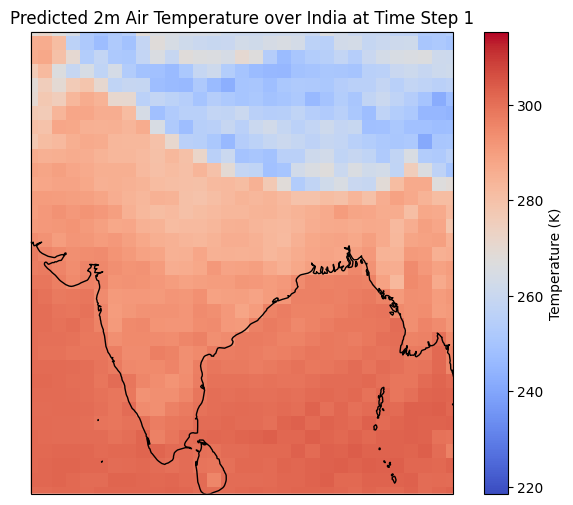

In [23]:

# Define the function to run the model
def run_model(params, state, inputs, targets_template, forcings):
    predictions = run_forward_jitted(
        rng=jax.random.PRNGKey(0),
        inputs=inputs,
        targets_template=targets_template,
        forcings=forcings,
        params=old_params,
        state=state
    )
    return predictions

# Prepare the targets template (filled with NaNs)
targets_template = train_targets * np.nan

# Run the model with the fine-tuned parameters
predictions = run_model(old_params, state, train_inputs, targets_template, train_forcings)

# Extract the variable of interest (e.g., temperature)
temperature_pred = predictions['2m_temperature']

# Plotting
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Select a time step to visualize
time_step = 1

# Ensure the DataArray is 2-dimensional (latitude, longitude)
temperature_2d = temperature_pred.isel(time=time_step).squeeze()

# Plotting
fig = plt.figure(figsize=(8, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([68, 98, 6, 38])  # India focus

# Plot the predicted temperature
temperature_2d.plot.pcolormesh(
    ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
    cbar_kwargs={'label': 'Temperature (K)'})

ax.coastlines()
ax.set_title(f"Predicted 2m Air Temperature over India at Time Step {time_step}")
plt.show()

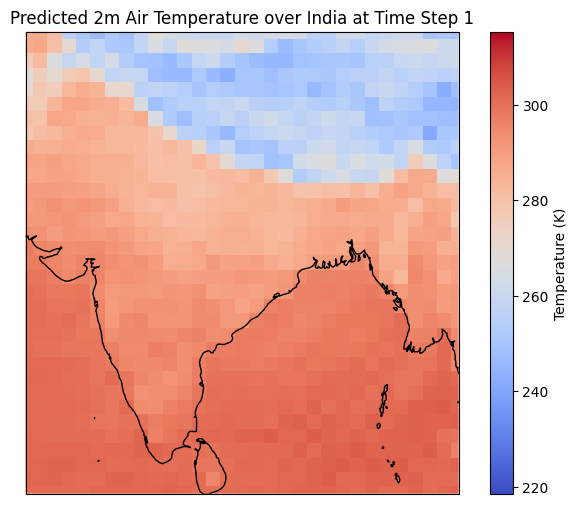

In [24]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Define the bounding boxes for each region
regions = {
    # "USA and Canada": [-170, -50, 25, 83],
    # "Europe": [-25, 45, 35, 72],
    # "Africa": [-18, 52, -35, 38],
    # "Australia": [112, 155, -44, -10],
    # "East Asia": [100, 150, 5, 55],
    # "South America": [-82, -34, -56, 13],
    "India": [68, 98, 6, 38],
}

# Select a time step to visualize
time_step = 1

# Loop through each region to plot the corresponding map
for region_name, bounds in regions.items():
    west, east, south, north = bounds

    # Ensure the DataArray is 2-dimensional (latitude, longitude)
    temperature_2d = temperature_pred.isel(time=time_step).squeeze()

    # Plotting
    fig = plt.figure(figsize=(8, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([west, east, south, north], crs=ccrs.PlateCarree())

    # Plot the predicted temperature
    temperature_2d.plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
        cbar_kwargs={'label': 'Temperature (K)'})

    ax.coastlines()
    ax.set_title(f"Predicted 2m Air Temperature over {region_name} at Time Step {time_step}")
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Function to run the model and get predictions
def run_model(params, state, inputs, targets_template, forcings):
    predictions = run_forward_jitted(
        rng=jax.random.PRNGKey(0),
        inputs=inputs,
        targets_template=targets_template,
        forcings=forcings,
        params=params,
        state=state
    )
    return predictions

# Prepare the targets template (filled with NaNs)
targets_template = eval_targets * np.nan

# Run the model with the old (unfinetuned) parameters
predictions_old = run_model(old_params, state, eval_inputs, targets_template, eval_forcings)

# Run the model with the finetuned parameters
predictions_finetuned = run_model(new_params, state, eval_inputs, targets_template, eval_forcings)

# Extract the variable of interest (e.g., '2m_temperature')
variable_name = '2m_temperature'
temperature_pred_old = predictions_old[variable_name]
temperature_pred_finetuned = predictions_finetuned[variable_name]
temperature_targets = eval_targets[variable_name]

# Define the time steps to visualize
time_steps = [0, 1, 2]  # Adjust as needed

# Function to plot predictions over India
def plot_predictions(time_step):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    extent = [68, 98, 6, 38]  # Focus on India

    # Old predictions
    ax = axs[0]
    temp_old = temperature_pred_old.isel(time=time_step).squeeze()
    temp_old.plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
        cbar_kwargs={'label': 'Temperature (K)'})
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Old Predictions at Time Step {time_step}")

    # Finetuned predictions
    ax = axs[1]
    temp_finetuned = temperature_pred_finetuned.isel(time=time_step).squeeze()
    temp_finetuned.plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
        cbar_kwargs={'label': 'Temperature (K)'})
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Finetuned Predictions at Time Step {time_step}")

    # Difference between finetuned and old predictions
    ax = axs[2]
    difference = temp_finetuned - temp_old
    difference.plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': 'Temperature Difference (K)'})
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Difference at Time Step {time_step}")

    plt.tight_layout()
    # plt.show()

# Plot predictions for each time step
for time_step in time_steps:
    plot_predictions(time_step)

# Function to plot difference between finetuned predictions and ground truth
def plot_difference_with_targets(time_step):
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    extent = [68, 98, 6, 38]  # Focus on India

    # Difference between finetuned predictions and evaluation targets
    temp_finetuned = temperature_pred_finetuned.isel(time=time_step).squeeze()
    temp_targets = temperature_targets.isel(time=time_step).squeeze()
    difference = temp_finetuned - temp_targets

    difference.plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': 'Temperature Difference (K)'})
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Finetuned Prediction vs Ground Truth at Time Step {time_step}")

    plt.tight_layout()
    # plt.show()

# Plot differences with ground truth for each time step
for time_step in time_steps:
    plot_difference_with_targets(time_step)



In [26]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from sklearn.metrics import mean_squared_error

# Function to run the model and get predictions
def run_model(params, state, inputs, targets_template, forcings):
    predictions = run_forward_jitted(
        rng=jax.random.PRNGKey(0),
        inputs=inputs,
        targets_template=targets_template,
        forcings=forcings,
        params=params,
        state=state
    )
    return predictions

# Prepare the targets template (filled with NaNs)
targets_template = eval_targets * np.nan

# Run the model with old (base) and finetuned parameters
predictions_old = run_model(old_params, state, eval_inputs, targets_template, eval_forcings)
predictions_finetuned = run_model(new_params, state, eval_inputs, targets_template, eval_forcings)

# Extract the variable of interest
variable_name = '2m_temperature'
temperature_pred_old = predictions_old[variable_name]
temperature_pred_finetuned = predictions_finetuned[variable_name]
temperature_targets = eval_targets[variable_name]


In [27]:
predictions_old.to_netcdf(f"/content/drive/MyDrive/predictions_old.nc")
predictions_finetuned.to_netcdf(f'/content/drive/MyDrive/predictions_finetuned.nc')

In [28]:
predictions_finetuned

<xarray.Dataset> Size: 130MB
Dimensions:                  (time: 6, batch: 1, lat: 181, lon: 360, level: 13)
Coordinates:
  * time                     (time) timedelta64[ns] 48B 06:00:00 ... 1 days 1...
  * lon                      (lon) float32 1kB 0.0 1.0 2.0 ... 357.0 358.0 359.0
  * lat                      (lat) float32 724B -90.0 -89.0 -88.0 ... 89.0 90.0
  * level                    (level) int32 52B 50 100 150 200 ... 850 925 1000
Dimensions without coordinates: batch
Data variables:
    10m_u_component_of_wind  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    10m_v_component_of_wind  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    2m_temperature           (time, batch, lat, lon) float32 2MB xarray_jax.J...
    geopotential             (time, batch, level, lat, lon) float32 20MB xarr...
    mean_sea_level_pressure  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    specific_humidity        (time, batch, level, lat, lon) float32 20MB xarr...
    temperature              (time, batch, level, lat, lon) float32 20MB xarr...
    total_precipitation_6hr  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    u_component_of_wind      (time, batch, level, lat, lon) float32 20MB xarr...
    v_component_of_wind      (time, batch, level, lat, lon) float32 20MB xarr...
    vertical_velocity        (time, batch, level, lat, lon) float32 20MB xarr...

In [29]:
variables = ['2m_temperature', 'total_precipitation_6hr']

In [ ]:
regions = {
    # "USA": [220, 310, 25, 83],
    # "Europe": [0, 60, 35, 75],
    # "West Asia": [10, 65,10, 45],
    # "Australia": [100, 160, -44, -10],
    # "East Asia": [90, 180, 1, 55],
    # "South America": [275, 330, -56, 13],
    "India": [68, 98, 6, 38],
}


# Define the time steps to visualize
time_steps = range(len(predictions_old.time))  # Visualize all time steps

# Function to plot comparisons for a given time step and region

def plot_comparisons_for_region(time_step, region_name, bounds, variable):
    west, east, south, north = bounds
    extent = [west, east, south, north]

    fig, axs = plt.subplots(3, 1, figsize=(12, 18), subplot_kw={'projection': ccrs.PlateCarree()})

    # Difference between base prediction and ground truth
    ax = axs[0]
    diff_base_gt = predictions_old[variable].isel(time=time_step) - eval_targets[var].isel(time=time_step)
    diff_base_gt.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': f'{var} Difference'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Base Prediction vs Ground Truth (Time Step {time_step})  for {variable}")
    lon_min, lon_max, lat_min, lat_max = bounds[0], bounds[1], bounds[2], bounds[3]
    # rmse_base = np.sqrt(mean_squared_error(eval_targets[var].isel(time=time_step).values.flatten(), predictions_old[variable].isel(time=time_step).values.flatten()))
    rmse_base = np.sqrt(mean_squared_error(eval_targets[var].isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten(), predictions_old[variable].isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten()))


    # Difference between finetuned prediction and ground truth
    ax = axs[1]
    diff_finetuned_gt = predictions_finetuned[variable].isel(time=time_step) - eval_targets[var].isel(time=time_step)
    diff_finetuned_gt.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': f'{var} Difference (K)'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Finetuned Prediction vs Ground Truth (Time Step {time_step}) for {variable}")

    rmse_finetuned = np.sqrt(mean_squared_error(eval_targets[var].isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten(), predictions_finetuned[variable].isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten()))


    # Difference between finetuned and base predictions
    ax = axs[2]
    diff_finetuned_base = predictions_finetuned[variable].isel(time=time_step) - predictions_old[variable].isel(time=time_step)
    diff_finetuned_base.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
        cbar_kwargs={'label': f'{var} Difference (K)'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Finetuned vs Base Prediction (Time Step {time_step})")

    plt.tight_layout()
    # plt.show()
    return rmse_base, rmse_finetuned

# Loop over each region and time step

for region_name, bounds in regions.items():
    for var in variables:
      base_rmses = []
      finetuned_rmses = []
      for time_step in time_steps:
          base_rmses.append(plot_comparisons_for_region(time_step, region_name, bounds, var)[0])
          finetuned_rmses.append(plot_comparisons_for_region(time_step, region_name, bounds, var)[1])


  # Plotting both lists against list1
      plt.figure(figsize=(8, 6))


      time_steps_list = list(time_steps)
      plt.plot(time_steps_list,base_rmses, marker='o', linestyle='-', color='b', label='Base')
      plt.plot(time_steps_list,finetuned_rmses, marker='s', linestyle='-', color='g', label='Finetuned')

      # Adding labels and title
      plt.xlabel('Time Step')
      plt.ylabel(f'{var}')
      plt.title(f'{region_name} RMSE for {var}')
      plt.legend()
      plt.grid(True)

      # Display the plot
      plt.show()

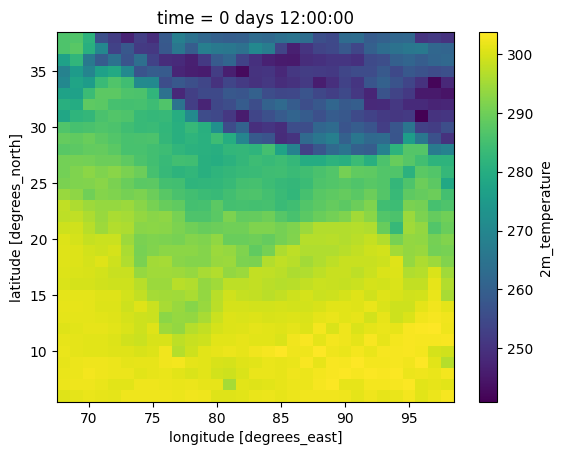

In [31]:
regions = {
    # "USA": [230, 310, 25, 83],
    # "Europe": [0, 70, 35, 72],
    # "Africa": [40, 75,18, 45],
    # "Australia": [125, 170, -44, -10],
    # "East Asia": [100, 180, 5, 55],
    # "South America": [275, 320, -56, 13],
    "India": [68, 98, 6, 38],
}

for region_name, bounds in regions.items():
    lon_min, lon_max, lat_min, lat_max = bounds[0], bounds[1], bounds[2], bounds[3]
temperature_pred_old.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).isel(time=1).plot()

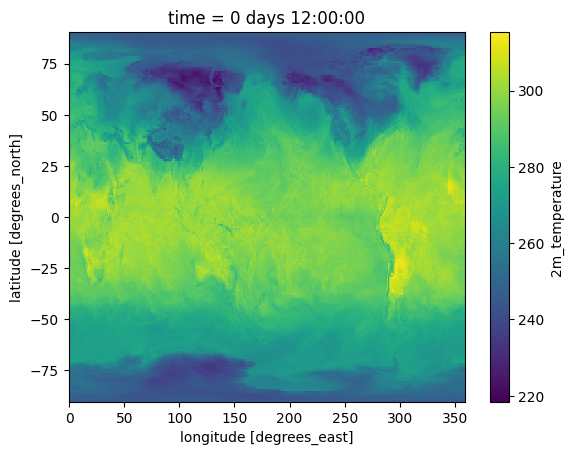

In [32]:
temperature_pred_old.isel(time=1).plot()

/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


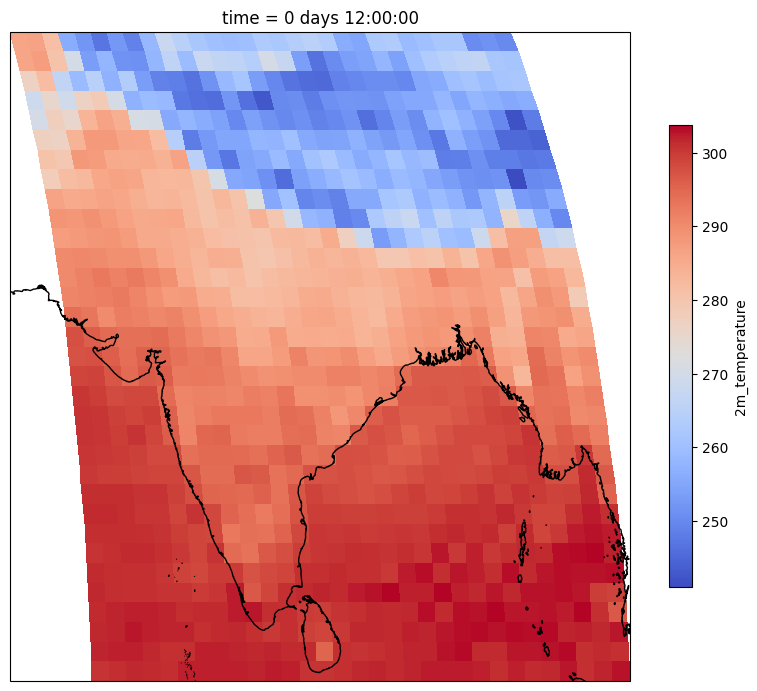

In [33]:
import cartopy.crs as ccrs
import cartopy

fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.Robinson())
ax.coastlines(resolution="10m")
temperature_pred_old.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).isel(time=1).plot( cmap=plt.cm.coolwarm, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.6})

In [ ]:

# Define the time steps to visualize
time_steps = range(len(temperature_pred_old.time))  # Visualize all time steps

# Function to plot comparisons for a given time step
def plot_comparisons(time_step):
    fig, axs = plt.subplots(3, 1, figsize=(12, 18), subplot_kw={'projection': ccrs.PlateCarree()})
    extent = [68, 98, 6, 38]  # Focus on India

    # Difference between base prediction and ground truth
    ax = axs[0]
    diff_base_gt = temperature_pred_old.isel(time=time_step) - temperature_targets.isel(time=time_step)
    diff_base_gt.plot(ax=ax)
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Base Prediction vs Ground Truth (Time Step {time_step})")
    rmse_base = np.sqrt(mean_squared_error(temperature_targets.isel(time=time_step).values.flatten(), temperature_pred_old.isel(time=time_step).values.flatten()))
    print(rmse_base)

    # Difference between finetuned prediction and ground truth
    ax = axs[1]
    diff_finetuned_gt = temperature_pred_finetuned.isel(time=time_step) - temperature_targets.isel(time=time_step)
    diff_finetuned_gt.plot(
        ax=ax)
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Finetuned Prediction vs Ground Truth (Time Step {time_step})")

    # Difference between finetuned and base predictions
    ax = axs[2]
    diff_finetuned_base = temperature_pred_finetuned.isel(time=time_step) - temperature_pred_old.isel(time=time_step)
    diff_finetuned_base.plot(
        ax=ax)
    ax.set_extent(extent)
    ax.coastlines()
    ax.set_title(f"Finetuned vs Base Prediction (Time Step {time_step})")

    plt.tight_layout()
    # plt.show()

# Plot comparisons for each time step
for time_step in [1]:
    plot_comparisons(time_step)


In [35]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Define the bounding boxes for each region
regions = {
    # "USA": [230, 310, 25, 83],
    # "Europe": [0, 70, 35, 72],
    # "Africa": [40, 75,18, 45],
    # "Australia": [125, 170, -44, -10],
    # "East Asia": [100, 180, 5, 55],
    # "South America": [275, 320, -56, 13],
    "India": [68, 98, 6, 38],
}

for region_name, bounds in regions.items():
    lon_min, lon_max, lat_min, lat_max = bounds[0], bounds[1], bounds[2], bounds[3]

    # Create the plot with Cartopy projection
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lon_min, lon_max, lat_min, lat_max])  # Set region bounds

    # Plot the difference with coastlines
    diff = temperature_pred_old.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)) - temperature_targets.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))
    diff.plot(ax=ax)

    # Add coastlines
    ax.coastlines()

    # Set the title for each region
    ax.set_title(f"Difference for {region_name} at Time Step {time_step}")

    # plt.show()
    plt.clf()


<Figure size 800x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Define the bounding boxes for each region
# the lon is from 0 to 360 and lat from -90 to 90 but the maps are centred at the middle of the pacific ocean around the international date line so adjust accordingly
regions = {
    # "USA": [230, 310, 25, 83],
    # "Europe": [0, 70, 35, 72],
    # "Africa": [40, 75,18, 45],
    # "Australia": [125, 170, -44, -10],
    # "East Asia": [100, 180, 5, 55],
    # "South America": [275, 320, -56, 13],
    "India": [68, 98, 6, 38],
}



# Define the time steps to visualize
time_steps = range(len(temperature_pred_old.time))  # Visualize all time steps

# Function to plot comparisons for a given time step and region

def plot_comparisons_for_region(time_step, region_name, bounds):
    west, east, south, north = bounds
    extent = [west, east, south, north]

    fig, axs = plt.subplots(3, 1, figsize=(12, 18), subplot_kw={'projection': ccrs.PlateCarree()})

    # Difference between base prediction and ground truth
    ax = axs[0]
    diff_base_gt = temperature_pred_old.isel(time=time_step) - temperature_targets.isel(time=time_step)
    diff_base_gt.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': 'Temperature Difference (K)'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Base Prediction vs Ground Truth (Time Step {time_step})")
    lon_min, lon_max, lat_min, lat_max = bounds[0], bounds[1], bounds[2], bounds[3]
    # rmse_base = np.sqrt(mean_squared_error(temperature_targets.isel(time=time_step).values.flatten(), temperature_pred_old.isel(time=time_step).values.flatten()))
    rmse_base = np.sqrt(mean_squared_error(temperature_targets.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten(), temperature_pred_old.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten()))


    # Difference between finetuned prediction and ground truth
    ax = axs[1]
    diff_finetuned_gt = temperature_pred_finetuned.isel(time=time_step) - temperature_targets.isel(time=time_step)
    diff_finetuned_gt.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='bwr',
        cbar_kwargs={'label': 'Temperature Difference (K)'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Finetuned Prediction vs Ground Truth (Time Step {time_step})")

    rmse_finetuned = np.sqrt(mean_squared_error(temperature_targets.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten(), temperature_pred_finetuned.isel(time=time_step).sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)).values.flatten()))


    # Difference between finetuned and base predictions
    ax = axs[2]
    diff_finetuned_base = temperature_pred_finetuned.isel(time=time_step) - temperature_pred_old.isel(time=time_step)
    diff_finetuned_base.squeeze().plot.pcolormesh(
        ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',
        cbar_kwargs={'label': 'Temperature Difference (K)'})
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"{region_name} - Finetuned vs Base Prediction (Time Step {time_step})")

    plt.tight_layout()
    # plt.show()
    return rmse_base, rmse_finetuned

# Loop over each region and time step
basefine=[]
for region_name, bounds in regions.items():
    base_rmses = []
    finetuned_rmses = []
    for time_step in time_steps:
        base_rmses.append(plot_comparisons_for_region(time_step, region_name, bounds)[0])
        finetuned_rmses.append(plot_comparisons_for_region(time_step, region_name, bounds)[1])


# Plotting both lists against list1
    plt.figure(figsize=(8, 6))


    time_steps_list = list(time_steps)
    plt.plot(time_steps_list,base_rmses, marker='o', linestyle='-', color='b', label='Base')
    plt.plot(time_steps_list,finetuned_rmses, marker='s', linestyle='-', color='g', label='Finetuned')

    # Adding labels and title
    plt.xlabel('List 1')
    plt.ylabel('Values')
    plt.title(f'{region_name} Plot')
    plt.legend()
    plt.grid(True)

    # Display the plot
    plt.show()


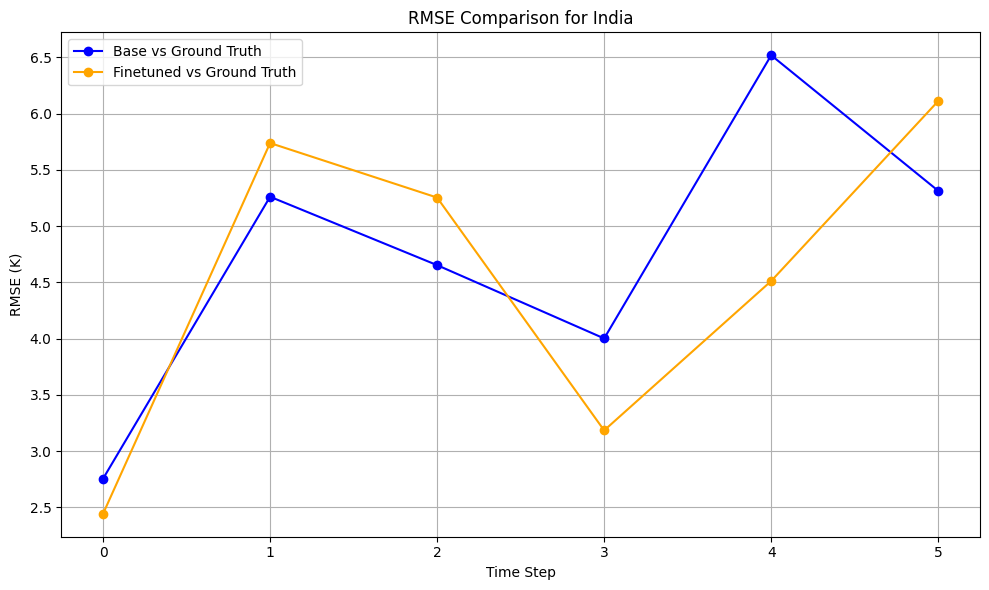

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Function to compute RMSE for a region at a given time step
def compute_rmse(predictions, targets, bounds):
    west, east, south, north = bounds
    preds_region = predictions.sel(lat=slice(south, north), lon=slice(west, east))
    targets_region = targets.sel(lat=slice(south, north), lon=slice(west, east))
    return np.sqrt(mean_squared_error(targets_region.values.flatten(), preds_region.values.flatten()))

# Loop over regions and compute RMSEs for each time step
for region_name, bounds in regions.items():
    rmse_base = []
    rmse_finetuned = []

    for time_step in time_steps:
        # Compute RMSE for base and finetuned predictions
        rmse_base.append(
            compute_rmse(temperature_pred_old.isel(time=time_step),
                         temperature_targets.isel(time=time_step),
                         bounds)
        )
        rmse_finetuned.append(
            compute_rmse(temperature_pred_finetuned.isel(time=time_step),
                         temperature_targets.isel(time=time_step),
                         bounds)
        )

    # Plot RMSE comparison for the region
    plt.figure(figsize=(10, 6))
    plt.plot(time_steps, rmse_base, label='Base vs Ground Truth', marker='o', color='blue')
    plt.plot(time_steps, rmse_finetuned, label='Finetuned vs Ground Truth', marker='o', color='orange')
    plt.xlabel('Time Step')
    plt.ylabel('RMSE (K)')
    plt.title(f'RMSE Comparison for {region_name}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [38]:

# @title Autoregressive rollout (keep the loop in JAX)
print("Inputs:  ", train_inputs.dims.mapping)
print("Targets: ", train_targets.dims.mapping)
print("Forcings:", train_forcings.dims.mapping)

predictions = run_forward_jitted(
    rng=jax.random.PRNGKey(0),
    inputs=train_inputs,
    targets_template=train_targets * np.nan,
    forcings=train_forcings)
predictions


Inputs:   {'batch': 1, 'time': 2, 'lat': 181, 'lon': 360, 'level': 13}
Targets:  {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360, 'level': 13}
Forcings: {'batch': 1, 'time': 6, 'lat': 181, 'lon': 360}


<xarray.Dataset> Size: 130MB
Dimensions:                  (time: 6, batch: 1, lat: 181, lon: 360, level: 13)
Coordinates:
  * time                     (time) timedelta64[ns] 48B 06:00:00 ... 1 days 1...
  * lon                      (lon) float32 1kB 0.0 1.0 2.0 ... 357.0 358.0 359.0
  * lat                      (lat) float32 724B -90.0 -89.0 -88.0 ... 89.0 90.0
  * level                    (level) int32 52B 50 100 150 200 ... 850 925 1000
Dimensions without coordinates: batch
Data variables:
    10m_u_component_of_wind  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    10m_v_component_of_wind  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    2m_temperature           (time, batch, lat, lon) float32 2MB xarray_jax.J...
    geopotential             (time, batch, level, lat, lon) float32 20MB xarr...
    mean_sea_level_pressure  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    specific_humidity        (time, batch, level, lat, lon) float32 20MB xarr...
    temperature              (time, batch, level, lat, lon) float32 20MB xarr...
    total_precipitation_6hr  (time, batch, lat, lon) float32 2MB xarray_jax.J...
    u_component_of_wind      (time, batch, level, lat, lon) float32 20MB xarr...
    v_component_of_wind      (time, batch, level, lat, lon) float32 20MB xarr...
    vertical_velocity        (time, batch, level, lat, lon) float32 20MB xarr...

In [39]:
# # @title Gradient computation (backprop through time)
# loss, diagnostics, next_state, grads = grads_fn_jitted(
#     inputs=train_inputs,
#     targets=train_targets,
#     forcings=train_forcings)
# mean_grad = np.mean(jax.tree_util.tree_flatten(jax.tree_util.tree_map(lambda x: np.abs(x).mean(), grads))[0])
# print(f"Loss: {loss:.4f}, Mean |grad|: {mean_grad:.6f}")

In [40]:
# # @title Autoregressive rollout (keep the loop in JAX)
# print("Inputs:  ", train_inputs.dims.mapping)
# print("Targets: ", train_targets.dims.mapping)
# print("Forcings:", train_forcings.dims.mapping)

# predictions = run_forward_jitted(
#     rng=jax.random.PRNGKey(0),
#     inputs=train_inputs,
#     targets_template=train_targets * np.nan,
#     forcings=train_forcings)
# predictions